# README.md

## Intent of this notebook is to fully understand how to build a recommender system from scratch; with all the resources I used, I attempt to summarize the information for a general audience.

# Song Recommender System

## Introduction

As someone who uses Spotify daily, I always wondered what makes me come back to the app. For me, it's the ability to find new music. I have discovered my favorite artists through Spotify's Daily Mixes and song recommendations based on my playlists, but how do they do this? How do they give song recommendations based on what I like? 

**The goal of this project is to understand how Spotify might recommend a set of songs based on a user playlist and to create a system that might be used.**

Data can be found [here](https://www.kaggle.com/rodolfofigueroa/spotify-12m-songs)

**Limitations to the data**:
- Doesn't cover all songs in the Spotify's catalog
- Doesn't cover all songs in my specifc playlists
- No metadata provided (genres for each song, etc.)

## Overview of what a recommender system is

What is a recommender system? To put it simply, a system that has information about a user or a product and provides a relevant item based on the features of them. As mentioned before, I was able to find some of my favorite songs on Spotify. Spotify provides personalized playlists dependent on my listening activity and those songs in those playlists are the outputs of the recommender system.

You can see how a recommender system can be valuable to many other companies, such as YouTube, Netflix, Hulu, and Amazon just to name a few. They increase user engagement and sales, ultimately helping their business grow. 

There are 2 types of recommender systems. Collaborative and content-based. 

We are going to build a **content-based recommender system** which takes information about the user and/or items to make recommendations rather than using user activity, since we don't have access to Spotify's user activity data. 

Later in the notebook, we will go over what kind of specific features of the user/item that will drive our recommender system and how we need to prepare our data to do so. 

## Steps to build content-based recommender system
1. **Gather the data**
    - Add genres to Kaggle Dataset
    - **Performed in another notebook**
    
    
2. **Connect to Spotify API and spotipy**
    - Get my playlist information
    - Get Spotify song data to add to the Kaggle data
    
    
3. **Data cleaning/preparation**
    - Summary statistics
    - Regex cleaning
    - Data types
    
    
4. **Feature engineering**
    - Dummy variables or One Hot Encoding for Year feature https://machinelearningmastery.com/why-one-hot-encode-data-in-machine-learning/
    - Normalizing the numeric features
    - TF-IDF (Term frequency - Inverse Document Frequency) for the artists https://www.youtube.com/watch?v=D2V1okCEsiE
    
    
5. **Create playlist vector**
    - This vector defines the attributes of our playlist
    - Add recency bias
    
    
6. **Make recommendations**
    - Based on cosine similarity https://www.youtube.com/watch?v=ieMjGVYw9ag
    - Recommender system 1: Only genres + song features
    - Recommender system 2: Adding an artist recommender to song recommender
    
    
7. **Evaluate performance of the model**
    - How do we know our models are performing well?
    - Research on how to do that


## Methods
- Data Cleaning and Preparation
- Feature Engineering
- Content based recommender

## Technologies
- Python
    - pandas
    - spotipy
    - sklearn

## Acknowledgements
1. https://github.com/madhavthaker/spotify-recommendation-system/blob/main/spotify-recommendation-engine.ipynb
2. https://www.youtube.com/watch?v=xdq6Gz33khQ&t=494s
3. https://github.com/codingforentrepreneurs/30-Days-of-Python/tree/master/tutorial-reference/Day%2019

In [1]:
import pandas as pd
import numpy as np
import re
import datetime
import json
import spotipy
import requests
import base64
from urllib.parse import urlencode
from spotipy.oauth2 import SpotifyOAuth

from PIL import Image
import matplotlib.pyplot as plt
import math

## 2. Connect to Spotify API  and spotipy

We will use the Spotify to get song attributes to make our recommendations.

### Spotify API - Client Credentials Flow

In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
@author: CodingEntrepreneurs
@github: https://github.com/codingforentrepreneurs
"""

client_id = '3a59181b7b554234b55258066bbe7cbd'
client_secret = '1d3cee53b7d04618a72337e62eb399f3'

class SpotifyAPI(object):
    access_token = None
    access_token_expires = datetime.datetime.now()
    access_token_did_expire = True
    client_id = None
    client_secret = None
    token_url = "https://accounts.spotify.com/api/token"
    
    def __init__(self, client_id, client_secret, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.client_id = client_id
        self.client_secret = client_secret

    def get_client_credentials(self):
        """
        Returns a base64 encoded string
        """
        client_id = self.client_id
        client_secret = self.client_secret
        if client_secret == None or client_id == None:
            raise Exception("You must set client_id and client_secret")
        client_creds = f"{client_id}:{client_secret}"
        client_creds_b64 = base64.b64encode(client_creds.encode())
        return client_creds_b64.decode()
    
    def get_token_headers(self):
        client_creds_b64 = self.get_client_credentials()
        return {
            "Authorization": f"Basic {client_creds_b64}"
        }
    
    def get_token_data(self):
        return {
            "grant_type": "client_credentials"
        } 
    
    def perform_auth(self):
        token_url = self.token_url
        token_data = self.get_token_data()
        token_headers = self.get_token_headers()
        r = requests.post(token_url, data=token_data, headers=token_headers)
        if r.status_code not in range(200, 299):
            raise Exception("Could not authenticate client.")
            # return False
        data = r.json()
        now = datetime.datetime.now()
        access_token = data['access_token']
        expires_in = data['expires_in'] # seconds
        expires = now + datetime.timedelta(seconds=expires_in)
        self.access_token = access_token
        self.access_token_expires = expires
        self.access_token_did_expire = expires < now
        return True
    
    def get_access_token(self):
        token = self.access_token
        expires = self.access_token_expires
        now = datetime.datetime.now()
        if expires < now:
            self.perform_auth()
            return self.get_access_token()
        elif token == None:
            self.perform_auth()
            return self.get_access_token() 
        return token
    
    def get_resource_header(self):
        access_token = self.get_access_token()
        headers = {
            "Authorization": f"Bearer {access_token}"
        }
        return headers
        
        
    def get_resource(self, lookup_id, resource_type='albums', version='v1'):
        endpoint = f"https://api.spotify.com/{version}/{resource_type}/{lookup_id}"
        headers = self.get_resource_header()
        r = requests.get(endpoint, headers=headers)
        if r.status_code not in range(200, 299):
            return {}
        return r.json()
    
    def get_album(self, _id):
        return self.get_resource(_id, resource_type='albums')
    
    def get_artist(self, _id):
        return self.get_resource(_id, resource_type='artists')
    
    def search(self, query, search_type='artist'): # type
        headers = self.get_resource_header()
        endpoint = "https://api.spotify.com/v1/search"
        data = urlencode({"q": query, "type": search_type.lower()})
        lookup_url = f"{endpoint}?{data}"
        r = requests.get(lookup_url, headers=headers)
        if r.status_code not in range(200, 299):  
            return {}
        return r.json()

### Spotipy - Authorization Code Flow

This is module wraps the SpotifyAPI in a concise and simpler way. We need this to access user info (my playlists).

In [3]:
scope = "user-library-read"
redirect_uri = 'http://localhost:8080/'
auth_manager = SpotifyOAuth(client_id=client_id,
                            client_secret=client_secret,
                            redirect_uri=redirect_uri,
                            scope=scope)

In [4]:
sp = SpotifyAPI(client_id, client_secret)
spotify_py = spotipy.Spotify(auth_manager=auth_manager)

## 3. Data cleaning/preparation

There's another notebook that uses the SpotifyAPI to add more features to the Kaggle dataset. We will load the new file here.

In [5]:
songs = pd.read_csv('final_spotify_catalog.csv')

In [6]:
songs.tail()

,Unnamed: 0,index,id,name,album,album_id,artists,artist_ids,track_number,disc_number,...,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year,release_date,new_artist_ids,artist_genres
991563,991563,1204020,0EsMifwUmMfJZxzoMPXJKZ,Gospel of Juke,Notch - EP,38O5Ys0W9PFS5K7dMb7yKb,FVLCRVM,['7AjItKsRnEYRSiBt2OxK1y'],2,1,...,0.00224,0.3370,0.415,159.586,276213,4.0,2014,2014-01-09,['7AjItKsRnEYRSiBt2OxK1y'],[['slovak electronic']]
991564,991564,1204021,2WSc2TB1CSJgGE0PEzVeiu,Prism Visions,Notch - EP,38O5Ys0W9PFS5K7dMb7yKb,FVLCRVM,['7AjItKsRnEYRSiBt2OxK1y'],3,1,...,0.64400,0.0749,0.781,121.980,363179,4.0,2014,2014-01-09,['7AjItKsRnEYRSiBt2OxK1y'],[['slovak electronic']]
991565,991565,1204022,6iProIgUe3ETpO6UT0v5Hg,Tokyo 360,Notch - EP,38O5Ys0W9PFS5K7dMb7yKb,FVLCRVM,['7AjItKsRnEYRSiBt2OxK1y'],4,1,...,0.91800,0.0664,0.467,121.996,385335,4.0,2014,2014-01-09,['7AjItKsRnEYRSiBt2OxK1y'],[['slovak electronic']]
991566,991566,1204023,37B4SXC8uoBsUyKCWnhPfX,Yummy!,Notch - EP,38O5Ys0W9PFS5K7dMb7yKb,FVLCRVM,['7AjItKsRnEYRSiBt2OxK1y'],5,1,...,0.77600,0.1170,0.227,124.986,324455,4.0,2014,2014-01-09,['7AjItKsRnEYRSiBt2OxK1y'],[['slovak electronic']]
991567,991567,1204024,3GgQmOxxLyRoAb4j86zOBX,That's The Way It Is,Notch - EP,38O5Ys0W9PFS5K7dMb7yKb,FVLCRVM,['7AjItKsRnEYRSiBt2OxK1y'],6,1,...,0.29600,0.2790,0.204,117.991,304982,4.0,2014,2014-01-09,['7AjItKsRnEYRSiBt2OxK1y'],[['slovak electronic']]


In [7]:
songs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 991568 entries, 0 to 991567
Data columns (total 28 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        991568 non-null  int64  
 1   index             991568 non-null  int64  
 2   id                991568 non-null  object 
 3   name              991568 non-null  object 
 4   album             991568 non-null  object 
 5   album_id          991568 non-null  object 
 6   artists           991558 non-null  object 
 7   artist_ids        991568 non-null  object 
 8   track_number      991568 non-null  int64  
 9   disc_number       991568 non-null  int64  
 10  explicit          991568 non-null  bool   
 11  danceability      991568 non-null  float64
 12  energy            991568 non-null  float64
 13  key               991568 non-null  int64  
 14  loudness          991568 non-null  float64
 15  mode              991568 non-null  int64  
 16  speechiness       99

### Next Steps

- Drop the Unnamed and index column (not the actual index) because they are not useful to our recommender system
- Check the new_artist_ids and their genres to see if I scraped correctly
- Drop duplicate songs in the catalog. Some songs have different song ids, but they represent the same song
- Figure out what features to include to make recommendations

In [8]:
songs.drop(['Unnamed: 0', 'index'], axis=1, inplace=True)

In [9]:
# Pick random artist
songs.sample(n=1, random_state=42)['new_artist_ids'].values[0]

# We will double check if we got the right genres for these artist_ids

"['2T06whb4s6UiufL1j5Qtz9', '2MwY1LeuAuGU4xygWhA8hT']"

In [10]:
artist_1 = sp.get_artist('2T06whb4s6UiufL1j5Qtz9')
artist_2 = sp.get_artist('2MwY1LeuAuGU4xygWhA8hT')
print(f"{artist_1['name']}'s genres: {artist_1['genres']}")
print(f"{artist_2['name']}'s genres: {artist_2['genres']}")

José Alfredo Jimenez's genres: ['mariachi', 'ranchera', 'regional mexican']
Alicia Juarez's genres: []


In [11]:
songs.sample(n=1, random_state=42)['artist_genres']

# We got the correct genres
# We can also say that the artist_genres and new_artist_ids look like lists, but they are actually just lists
# We need to change that

730846    [['mariachi', ' ranchera', ' regional mexican']]
Name: artist_genres, dtype: object

In [12]:
songs['name_artists'] = songs['name']+songs['artists']

In [13]:
songs.drop_duplicates(subset='name_artists', keep='first',inplace=True)

In [14]:
songs.dropna(inplace=True)

In [15]:
def clean_text(text):
    if text == "[]":
        return ["None"]
    text_list = text
    clean_text = re.sub("[(\"\'\[\])]", '', string=text_list).split(',')
    for i, g in enumerate(clean_text):
        clean_text[i] = g.strip().replace(" ","_")
    return clean_text    

songs['artists'] = songs['artists'].apply(clean_text)

From the code above, we can confirm we got the correct genres. We can also say that the `artist_genres` and `new_artist_ids` look like lists, but they are actually just lists. 

Since genres is going to be the main driver for our recommender system, let's visualize the distribution of all the genres.

### Exploratory Data Analysis

- clean the artist_genres first to make into 1 dimensional lists
- explode them
- create a dictionary with a counter for each genre OR pivot?

In [16]:
songs['artist_genres'] = songs['artist_genres'].apply(clean_text)

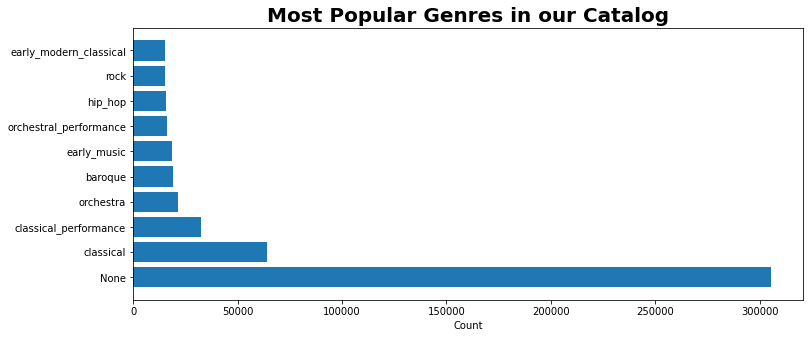

In [17]:
genre_counts = songs['artist_genres'].explode().value_counts().head(10)

fig = plt.figure(figsize=(12,5))
plt.barh(y=genre_counts.index, width=genre_counts.values)
plt.title("Most Popular Genres in our Catalog", fontdict={'fontsize':20, 'fontweight':'bold'})
plt.xlabel('Count')

plt.show()

The graph above shows how many songs have the specified genre based on the songs' artists. So, if Song 1 is written by Artist 1 and Artist 1 is classified as rock and rap, that would add 1 for each genre.

As mentioned before, this catalog does not cover every song in Spotify's database nor does it cover all the songs in my playlists. So, when we make recommendations, we have a limited selection of songs to choose from to make recommendations.

Now let's figure out what features and how we want these feautres to be formatted for our recommender system.

We will do that by learning how to build a recommender system.

## 4. Building Our Recommender System

When it comes to building recommender systems, there are 2 types, collaborative filtering methods and content based methods. For this project, we will use a content based method because we do not have access to user activity data. 

Our goal for this project is to take in a user playlist that has x amount of songs, and provide recommendations based on those songs that the user may like. So, what kind of information (features) are important for our system?

Based on prior prior observation, we have the following song features:

- `explicit` 
- `danceability` 
- `energy`
- `key` 
- `loudness` 
- `mode` 
- `speechiness` 
- `acousticness`
- `instrumentalness`
- `liveness`
- `valence`
- `tempo`
- `year`
- `artist_genres`

Here are the following things we must do to our features:
1. Normalize the float features
2. Calculate the TF-IDF for the genres and artists
3. Create dummy columns for `year`

## Understanding TF-IDF

Term Frequency - Inverse Document Frequency

In [18]:
songs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 951364 entries, 0 to 991567
Data columns (total 27 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                951364 non-null  object 
 1   name              951364 non-null  object 
 2   album             951364 non-null  object 
 3   album_id          951364 non-null  object 
 4   artists           951364 non-null  object 
 5   artist_ids        951364 non-null  object 
 6   track_number      951364 non-null  int64  
 7   disc_number       951364 non-null  int64  
 8   explicit          951364 non-null  bool   
 9   danceability      951364 non-null  float64
 10  energy            951364 non-null  float64
 11  key               951364 non-null  int64  
 12  loudness          951364 non-null  float64
 13  mode              951364 non-null  int64  
 14  speechiness       951364 non-null  float64
 15  acousticness      951364 non-null  float64
 16  instrumentalness  95

In [19]:
from sklearn import preprocessing
from sklearn.feature_extraction.text import TfidfVectorizer

def normalize_float(df):
    float_df = df.select_dtypes(include=[float])
    scaler = preprocessing.MinMaxScaler()
    float_norm = pd.DataFrame(scaler.fit_transform(float_df))
    float_norm.columns = float_df.columns

    return float_norm

def create_dummy(df, col, prefix):
    dummy = pd.get_dummies(df[col])
    dummy.columns = [prefix + "|" + str(i) for i in dummy.columns]
    dummy.reset_index(inplace=True, drop=True)
    
    return dummy

def get_tf_idf(df, col, prefix):
    vectorizer = TfidfVectorizer(token_pattern=r'\S+')
    X = vectorizer.fit_transform(df[col].apply(lambda x: " ".join(x)))
    genre_df = pd.DataFrame(X.toarray())
    genre_df.columns = [prefix +'|'+ i for i in vectorizer.get_feature_names()]
    
    return genre_df

def complete_feature_set(df):
    float_norm = normalize_float(df)
    dummies = create_dummy(df, 'year', 'year')
    tf_idf_genre = get_tf_idf(df, 'artist_genres', 'genre')
#     tf_idf_artist = get_tf_idf(df, 'artists', 'artist')
    
#     final_df = pd.concat([float_norm, dummies, tf_idf_genre, tf_idf_artist], axis=1)
    final_df = pd.concat([float_norm, dummies, tf_idf_genre], axis=1)
    final_df['song_id'] = df['id'].values
    
    return final_df

In [20]:
songs_randomized = songs.sample(frac=1, random_state=42)
len_df = int(songs_randomized.shape[0]/2)

catalog_1 = complete_feature_set(songs_randomized.iloc[:len_df])
catalog_2 = complete_feature_set(songs_randomized.iloc[len_df:])

In [21]:
# songs_randomized = songs.sample(n=10000, random_state=42)
# small_catalog = complete_feature_set(songs_randomized)

In [22]:
# small_catalog.head()

In [23]:
catalog_1.head()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,...,genre|zim_hip_hop,genre|zim_urban_groove,genre|zimdancehall,genre|zolo,genre|zouglou,genre|zouk,genre|zouk_riddim,genre|zurich_indie,genre|zydeco,song_id
0,0.686,0.4750,0.747507,0.032231,0.723896,0.000001,0.0876,0.695,0.438859,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3dnhYzINxZiVK3aCnAhjGj
1,0.269,0.0299,0.544043,0.037913,0.974900,0.410000,0.0702,0.173,0.323299,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33Og8nQO8Eh0no5N82i658
2,0.634,0.3930,0.759704,0.042769,0.534137,0.000000,0.1120,0.247,0.562655,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6YmC8bCZBBu94t9XmNWWZY
3,0.468,0.3640,0.686578,0.041012,0.459839,0.030000,0.0886,0.295,0.583408,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3M8xKzydSt3wWhh61eUy8G
4,0.254,0.9210,0.784936,0.036260,0.073394,0.517000,0.1480,0.824,0.594021,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1zR1MTluUh7VTfc2krAkEu


In [24]:
catalog_2.head()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,...,genre|zhongguo_feng,genre|zillertal,genre|zim_urban_groove,genre|zimdancehall,genre|zolo,genre|zouglou,genre|zouk,genre|zouk_riddim,genre|zydeco,song_id
0,0.442656,0.4620,0.753949,0.029132,0.803213,0.0145,0.1630,0.2450,0.567166,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0lU8E1ex2RBw2i7HL1kDsh
1,0.551308,0.9680,0.787607,0.068182,0.000021,0.4820,0.8100,0.3970,0.532271,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0cm1AmkdTNtmLORiLm7nL8
2,0.742455,0.8590,0.786551,0.066839,0.035241,0.5970,0.0735,0.8040,0.701326,0.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,74p4opG2yY4BLn8mJpaS15
3,0.124748,0.1620,0.422524,0.060847,0.848394,0.9360,0.0948,0.0669,0.287980,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4DKWeaGKxpD46zqQlocjkh
4,0.742455,0.0975,0.601243,0.050207,0.989960,0.0868,0.1120,0.5740,0.302779,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,08fi77k4PLzcDTk14GWy0H


## What info do I want from my playlists?

In [25]:
def get_song_info(p_name):
    playlist = pd.DataFrame()
    pid = my_playlists[p_name]
    songs = spotify_py.playlist_items(playlist_id=pid)['items']
    song_artists=[]
    song_artist_ids=[]
    
    for ix, s in enumerate(songs):
        a=[]
        a_id=[]
        # Adding the artists, if there's multiple
        for ix2, artists in enumerate(s['track']['artists']):
            a.append(artists['name'])
            a_id.append(artists['id'])
        song_artists.append(a)
        song_artist_ids.append(a_id)
#         playlist.loc[ix, 'artists'] = song_artists
#         playlist.loc[ix, 'artist_id'] = song_artist_ids
        playlist.loc[ix, 'name'] = s['track']['name']
        playlist.loc[ix, 'id'] = s['track']['id']
        playlist.loc[ix, 'img_url'] = s['track']['album']['images'][1]['url']
        playlist.loc[ix, 'date_added'] = s['added_at']
        
    playlist['artists'] = song_artists
    playlist['artist_id'] = song_artist_ids
    playlist['artists'] = playlist['artists'].astype(str).apply(clean_text)
    
    # Genres of the artists
    all_genres = []
    for ix, _ids in playlist['artist_id'].iteritems():
        genres=[]
        for _id in _ids:
            genres.append(sp.get_artist(_id)['genres'])
        all_genres.append(genres)
    playlist['artist_genres'] = all_genres
    playlist['artist_genres'] = playlist['artist_genres'].astype(str).apply(clean_text)
    
    # Getting the technical measures of the song
    song_features = pd.DataFrame()
    for ix, _id in enumerate(playlist['id']):
        audio_features_dict = sp.get_resource(_id, resource_type='audio-features')
        res = {key: audio_features_dict[key] for key in audio_features_dict.keys()
               & {'danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
                  'instrumentalness', 'liveness', 'valence', 'tempo'}}
        song_features = song_features.append(res, ignore_index=True)
        
    # Getting the year the song released
    years = []
    for ix, _id in enumerate(playlist['id']):
        date = pd.to_datetime(sp.get_resource(_id, resource_type='tracks')['album']['release_date'])
        year = date.year
        years.append(year)
    
    final_playlist = pd.concat([playlist, song_features], axis=1)
    final_playlist['year'] = years
        
    return final_playlist

In [26]:
my_playlists = {}
for pl in spotify_py.current_user_playlists()['items']:
    name = pl['name']
    pl_id = pl['id']
    my_playlists[name] = pl_id
    
my_playlists

{'artist-recommender': '0gqkIXyCw9TCUluYhgX2pD',
 'EDM': '2ZDqG7Hv6nhNw9rulB1Jey',
 'R&B': '0Yw86iUIK5MglkL9Ig8CfT',
 'hey get in ': '4T7nk5AaUwZj16UaPQGnvb',
 'late night drive': '6e5JbXoLXKhYrHANUCxEfI',
 'make an abg cry': '7tLIia6OTMnRQTMU30dswE',
 'dance high': '07BHUoyPCdhPOGw6THPvmm',
 'smooth ': '5gYjT8Uki1p6s9UICqfbGp',
 'gains': '3nfSYkSf3vxAe0ZeW0ILCl',
 'throwblack': '12nOXuepC4d6ydYyJDUk6K',
 'sublime': '2ZajOmx8ch0V7fJKFbDdnx',
 'emazing': '7MD1QOOrpwskkQi3lhyvOt',
 'for the culture': '5xcvZScbCqiLfO1vyG3V6z'}

In [28]:
# edm_playlist = get_song_info('EDM')
# sublime_playlist = get_song_info('sublime')
hgi_playlist = get_song_info('hey get in ')
lnd_playlist = get_song_info('late night drive')
# abg_playlist = get_song_info('make an abg cry')
rb_playlist = get_song_info('R&B')

In [29]:
lnd_playlist

,name,id,img_url,date_added,artists,artist_id,artist_genres,acousticness,tempo,loudness,speechiness,liveness,energy,valence,instrumentalness,danceability,year
0,Like I Want You,6qBFSepqLCuh5tehehc1bd,https://i.scdn.co/image/ab67616d00001e0218ff32...,2020-09-13T20:21:24Z,[Giveon],[4fxd5Ee7UefO4CUXgwJ7IP],"[pop, r&b]",0.759,119.772,-7.757,0.0627,0.114,0.355,0.4380,0.000071,0.678,2020
1,Favorite Mistake,4rHIfYRQw6ittRQXAlurk0,https://i.scdn.co/image/ab67616d00001e0218ff32...,2020-09-13T20:21:28Z,[Giveon],[4fxd5Ee7UefO4CUXgwJ7IP],"[pop, r&b]",0.777,170.123,-9.517,0.0855,0.129,0.409,0.1380,0.000000,0.535,2020
2,Heartbreak Anniversary,3FAJ6O0NOHQV8Mc5Ri6ENp,https://i.scdn.co/image/ab67616d00001e0218ff32...,2020-09-13T20:21:32Z,[Giveon],[4fxd5Ee7UefO4CUXgwJ7IP],"[pop, r&b]",0.524,89.087,-8.964,0.0791,0.303,0.465,0.5430,0.000001,0.449,2020
3,The Beach,2Hd7uGbl8PX0IxyX59VFOg,https://i.scdn.co/image/ab67616d00001e0218ff32...,2020-09-13T20:21:58Z,[Giveon],[4fxd5Ee7UefO4CUXgwJ7IP],"[pop, r&b]",0.181,99.813,-9.502,0.0659,0.932,0.509,0.2230,0.000655,0.649,2020
4,World We Created,51Ful1v7b81FchIFFTAQ05,https://i.scdn.co/image/ab67616d00001e0218ff32...,2020-09-13T20:22:02Z,[Giveon],[4fxd5Ee7UefO4CUXgwJ7IP],"[pop, r&b]",0.271,144.137,-7.085,0.0661,0.335,0.507,0.3300,0.000000,0.589,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,The Morning,6u0dQik0aif7FQlrhycG1L,https://i.scdn.co/image/ab67616d00001e02b29853...,2021-02-03T05:38:39Z,[The_Weeknd],[1Xyo4u8uXC1ZmMpatF05PJ],"[canadian_contemporary_r&b, canadian_pop, pop]",0.317,120.073,-7.555,0.0390,0.104,0.549,0.1860,0.000000,0.652,2012
66,The Party & The After Party,0dcf0L6F1LUA1nE2zWH4J2,https://i.scdn.co/image/ab67616d00001e02b29853...,2021-02-03T05:47:25Z,[The_Weeknd],[1Xyo4u8uXC1ZmMpatF05PJ],"[canadian_contemporary_r&b, canadian_pop, pop]",0.476,203.585,-7.456,0.3370,0.113,0.634,0.3970,0.000000,0.438,2012
67,That's Why I Love You (feat. Sabrina Claudio),3Ku9kSWtDQPC8bSWpHR7z0,https://i.scdn.co/image/ab67616d00001e02bbee54...,2021-02-13T08:58:49Z,"[SiR, Sabrina_Claudio]","[3QTDHixorJelOLxoxcjqGx, 30DhU7BDmF4PH0JVhu8ZRg]","[alternative_r&b, hip_hop, indie_soul, la_pop,...",0.333,119.849,-6.077,0.2840,0.130,0.496,0.5470,0.000000,0.640,2019
68,Warm December,5z7PRDOZGxMZqEIzNWKYjT,https://i.scdn.co/image/ab67616d00001e02e81f12...,2021-03-12T06:47:25Z,[Sabrina_Claudio],[30DhU7BDmF4PH0JVhu8ZRg],"[alternative_r&b, pop, r&b]",0.800,134.259,-7.303,0.0358,0.358,0.515,0.6490,0.000002,0.329,2020


## Visualize songs in the dataframe

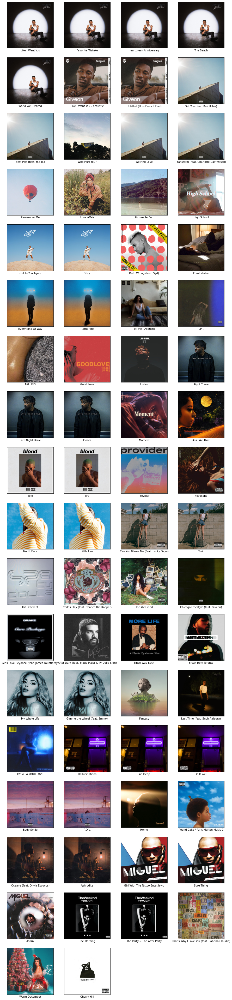

In [30]:
def visualize_songs(df):
    '''
    Parameters: 
    
    df - Dataframe with the song info.
    
    Returns:
    Plotted images of all the songs given in the dataframe.
    '''

    columns = 4
    rows = math.ceil(df.shape[0]/columns)
    fig = plt.figure(figsize=(15, df.shape[0]))

    for ix, url in enumerate(df['img_url']):

        fig.add_subplot(rows, columns, ix+1)
        im = Image.open(requests.get(url, stream=True).raw)
        plt.imshow(im)
        plt.xlabel(f"{df['name'][ix]}")
#         plt.xlabel(f"{df['name'][ix]} - {df['artists'][ix]}")
        plt.tick_params(left = False, bottom = False , labelleft = False ,labelbottom = False)
#         plt.tight_layout(h_pad=0.5, w_pad=0.5)
        plt.subplots_adjust(wspace=None, hspace=0.2)
    
    plt.show()
    
# Test    
# visualize_songs(edm_playlist)
visualize_songs(lnd_playlist)
# visualize_songs(hgi_playlist)

## 5 & 6. Creating a playlist vector and make recommendations

### Using Cosine similarity

In [31]:
from sklearn.metrics.pairwise import cosine_similarity

def add_recency_bias(df, col, weight=1):
    # Adding months ago
    month_added = pd.to_datetime(df[col]).dt.month
    current_month = datetime.datetime.now().month
    
    months_ago = current_month - month_added
    
    # Adding recency bias weight
    recency_bias = weight ** -(months_ago.astype(float))
    
    return recency_bias

def make_recommendations(playlist_df, catalog, r_weight=1, num_songs=10):
    final_catalog = catalog.copy()
    # Playlist vector
    my_playlist_vector = complete_feature_set(playlist_df)
    # Adding genre cols not in the catalog
    cols_not_in_catalog = list(set(my_playlist_vector.columns) - set(final_catalog.columns))
    final_catalog[cols_not_in_catalog] = 0
    # Playlist vector with recency bias
    recency_bias = np.asarray(add_recency_bias(playlist_df, 'date_added', r_weight))
    final_pl_vector = my_playlist_vector.select_dtypes(include='number').mul(recency_bias, axis='index').sum()

    # Making recommendations
    results = cosine_similarity(pd.DataFrame(final_pl_vector).transpose(), 
                                final_catalog[list(final_pl_vector.index)])

    results = pd.DataFrame(results).transpose()
    results.columns = ['cosine_sim']
    results['song_id'] = catalog['song_id']
    
    final_results = results.sort_values('cosine_sim', ascending=False).head(num_songs)
    
    return final_results

def get_track_info(df):
    new_df = pd.DataFrame()
    for ix, _id in enumerate(df['song_id']):
        result = sp.get_resource(lookup_id=_id, resource_type='tracks')
        try:
            new_df.loc[ix, 'name'] = result['name']
        except KeyError:
            new_df.loc[ix, 'name'] = 'NO NAME'
        artists = []
        for ix2, a in enumerate(result['artists']):
            artists.append(a['name'])
        new_df.loc[ix, 'artists'] = str(artists)
        new_df.loc[ix, 'img_url'] = result['album']['images'][1]['url']
        
    new_df['artists'] = new_df['artists'].apply(lambda x: re.sub(r"[\[\]']", "", x))
    
    return new_df

In [32]:
recommendations_1 = get_track_info(make_recommendations(lnd_playlist, catalog_1, r_weight=1.09, num_songs=20))
# recommendations_1 = get_track_info(make_recommendations(hgi_playlist, catalog_1, r_weight=1.09, num_songs=12))

In [33]:
recommendations_2 = get_track_info(make_recommendations(lnd_playlist, catalog_2, r_weight=1.09, num_songs=20))
# recommendations_2 = get_track_info(make_recommendations(hgi_playlist, catalog_2, r_weight=1.09, num_songs=12))

/opt/anaconda3/envs/song-recommender-spotify/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 12450 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/envs/song-recommender-spotify/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 12494 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/envs/song-recommender-spotify/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 12491 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/envs/song-recommender-spotify/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 12510 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/envs/song-recommender-spotify/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 12473 missing from current font.
  font.set_t

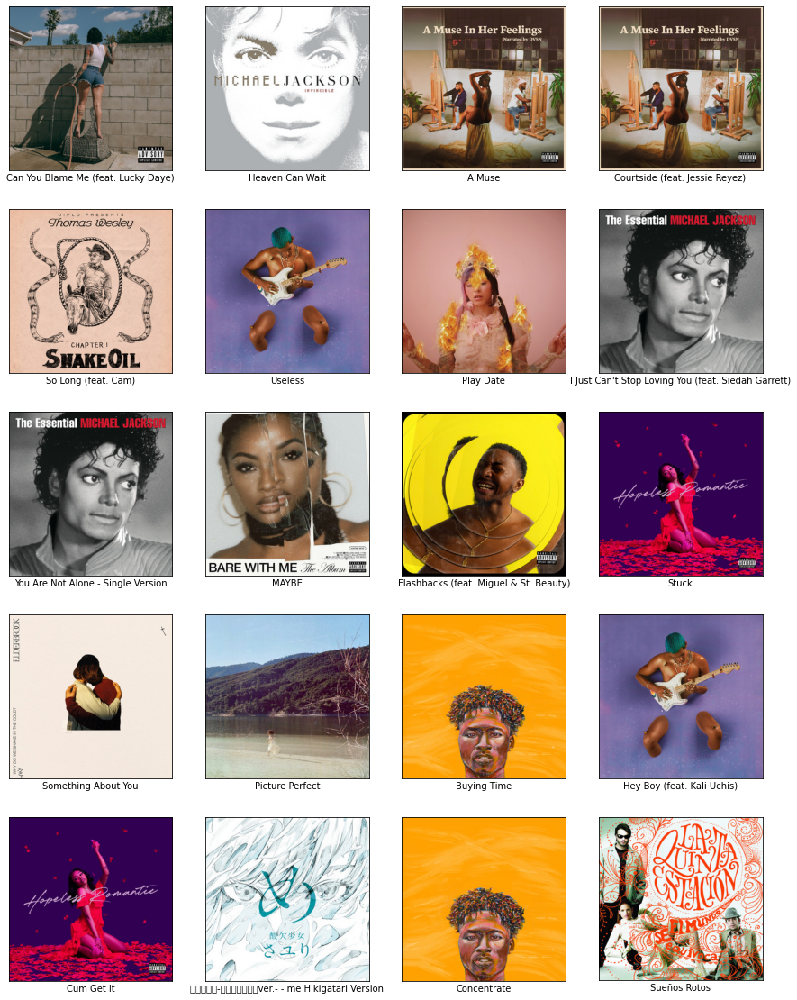

In [34]:
# Less songs in playlist
visualize_songs(recommendations_1)

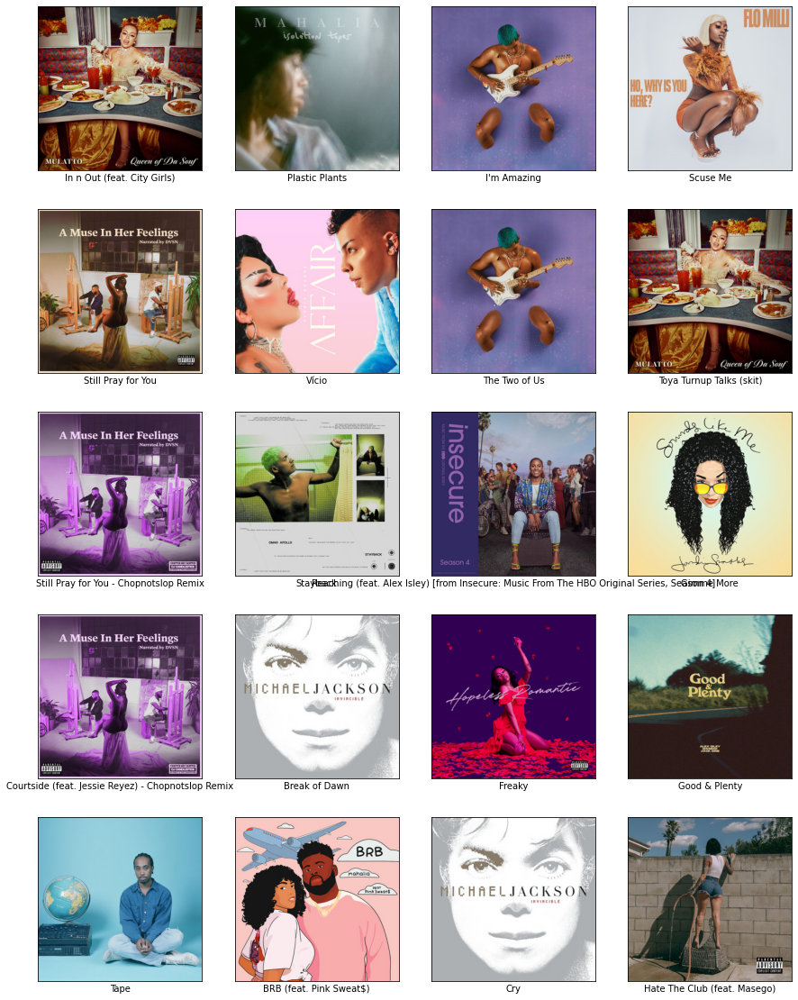

In [35]:
# Less songs in playlist
visualize_songs(recommendations_2)

In [36]:
recommendations_1

,name,artists,img_url
0,Can You Blame Me (feat. Lucky Daye),"Kehlani, Lucky Daye",https://i.scdn.co/image/ab67616d00001e023ba8dc...
1,Heaven Can Wait,Michael Jackson,https://i.scdn.co/image/ab67616d00001e02463de2...
2,A Muse,dvsn,https://i.scdn.co/image/ab67616d00001e023aba3b...
3,Courtside (feat. Jessie Reyez),"dvsn, Jessie Reyez",https://i.scdn.co/image/ab67616d00001e023aba3b...
4,So Long (feat. Cam),"Diplo, Cam",https://i.scdn.co/image/ab67616d00001e02d79c10...
5,Useless,Omar Apollo,https://i.scdn.co/image/ab67616d00001e02f7f425...
6,Play Date,Melanie Martinez,https://i.scdn.co/image/ab67616d00001e02f4d9b4...
7,I Just Can't Stop Loving You (feat. Siedah Gar...,"Michael Jackson, Siedah Garrett",https://i.scdn.co/image/ab67616d00001e02ed1c30...
8,You Are Not Alone - Single Version,Michael Jackson,https://i.scdn.co/image/ab67616d00001e02ed1c30...
9,MAYBE,Justine Skye,https://i.scdn.co/image/ab67616d00001e02c290fc...


In [37]:
recommendations_2

,name,artists,img_url
0,In n Out (feat. City Girls),"Latto, City Girls",https://i.scdn.co/image/ab67616d00001e02a9aa25...
1,Plastic Plants,Mahalia,https://i.scdn.co/image/ab67616d00001e021f8129...
2,I'm Amazing,Omar Apollo,https://i.scdn.co/image/ab67616d00001e02f7f425...
3,Scuse Me,Flo Milli,https://i.scdn.co/image/ab67616d00001e02c8a142...
4,Still Pray for You,dvsn,https://i.scdn.co/image/ab67616d00001e023aba3b...
5,Vício,Gloria Groove,https://i.scdn.co/image/ab67616d00001e02985b8b...
6,The Two of Us,Omar Apollo,https://i.scdn.co/image/ab67616d00001e02f7f425...
7,Toya Turnup Talks (skit),Latto,https://i.scdn.co/image/ab67616d00001e02a9aa25...
8,Still Pray for You - Chopnotslop Remix,"dvsn, DJ Candlestick, OG Ron C",https://i.scdn.co/image/ab67616d00001e02cc5cc2...
9,Stayback,Omar Apollo,https://i.scdn.co/image/ab67616d00001e0288b256...


### Results from this recommender system

Performs well when there is a limited number of songs in the playlist. But as the number of songs in the playlist increase, the recommendations become relatively worse just based on personal song knowledge.

Let's find similar artists to the playlists first, and then filter our catalog with just those artists.

## 6.2 Making Artists Recommendations + Song Recommendations
To add another dimension to this recommender system, let's find similar artists to our playlists and then have the catalog choose from the similar artists. This way our selection for our recommender system is narrowed down.

The downfalls I see to this is that it is computationally expensive. 

Similarily to how we made song recommendations, we are going to take only the genres of the artists of our playlists and find the most similar based on our artist catalog.

This artist catalog consists of the unique artists in our song catalog. We were able to generate this in the first notebook.

**Steps to find similar artists and make song recommendations:**
- Data cleaning/preparation
- Perform feature engineering on the information
    - TF-IDF on the genres
- Cosine similarity with user playlist artists and artists in catalog
- Return top x artists
- With top x artists, filter through song catalog with only songs that have those artists
- Perform song recommender based on the new catalog

### 6.2.a Data cleaning/preparation

In [38]:
artists = pd.read_csv('artists.csv')
artists.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)
artists.head()

,artist_ids,genres,artists
0,77tT1kLj6mCWtFNqiOmP9H,"['album rock', 'classic rock', 'mellow gold', ...",Daryl Hall & John Oates
1,2U6gqwyl9F33YxawnFrZG7,"['dance pop', 'europop', 'neo soul', 'new wave...",Will Young
2,1KsASRNugxU85T0u6zSg32,"['art pop', 'ectofolk', 'lilith', 'melancholia...",Tori Amos
3,3jfxxO6JNrzzhov82l1wX2,[],Death & Desire
4,0AiTwNtYX8m4uhfU7rJ8RD,"['anti-folk', 'buffalo ny indie', 'ectofolk', ...",Ani DiFranco


In [39]:
artists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126207 entries, 0 to 126206
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   artist_ids  126207 non-null  object
 1   genres      126202 non-null  object
 2   artists     126203 non-null  object
dtypes: object(3)
memory usage: 2.9+ MB


In [40]:
artists.dropna(inplace=True)

In [41]:
artists['clean_genres'] = artists['genres'].apply(clean_text)

In [42]:
artists.reset_index(drop=True, inplace=True)

### 6.2.b Feature Engineering

- TF-IDF on the genres

In [43]:
artist_catalog = get_tf_idf(artists, 'clean_genres', 'genre')
artist_catalog[['artist_ids', 'artists']] = artists[['artist_ids', 'artists']]

In [44]:
artist_catalog

,genre|21st_century_classical,genre|432hz,genre|48g,genre|5th_wave_emo,genre|8-bit,genre|a_cappella,genre|aarhus_indie,genre|aberdeen_indie,genre|abstract,genre|abstract_beats,...,genre|zim_urban_groove,genre|zimdancehall,genre|zolo,genre|zouglou,genre|zouk,genre|zouk_riddim,genre|zurich_indie,genre|zydeco,artist_ids,artists
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,77tT1kLj6mCWtFNqiOmP9H,Daryl Hall & John Oates
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2U6gqwyl9F33YxawnFrZG7,Will Young
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1KsASRNugxU85T0u6zSg32,Tori Amos
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3jfxxO6JNrzzhov82l1wX2,Death & Desire
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0AiTwNtYX8m4uhfU7rJ8RD,Ani DiFranco
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126193,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6lo3wQ6H0Zc4KVj7P79IyP,The Brothers Burn
126194,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5TphiK6LsT4X5NOZxq3NJB,Trio Vegabajeño
126195,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1oj9F8x44ah5gxYecEj8ch,NFL
126196,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0UnmV3m91hxEzspbZtoz5b,Maneja Beto


### 6.2.c-6.2.d Make artist recommendations with cosine similarity

In [45]:
def make_recommendations_artists(playlist_df, a_catalog, r_weight=1, num_artists=10):
    # Playlist vector
    my_playlist_vector = get_tf_idf(playlist_df, 'artist_genres', 'genre')
    
    # Playlist vector with recency bias
    recency_bias = np.asarray(add_recency_bias(playlist_df, 'date_added', r_weight))
    final_pl_vector = my_playlist_vector.select_dtypes(include='number').mul(recency_bias, axis='index').mean()

    results = cosine_similarity(pd.DataFrame(final_pl_vector).transpose(), 
                                a_catalog[list(final_pl_vector.index)])
    results = pd.DataFrame(results).transpose()
    results.columns = ['cosine_sim']
    results[['artists', 'artist_id']] = a_catalog[['artists', 'artist_ids']]
    
    
    final_results = results.sort_values('cosine_sim', ascending=False,).head(num_artists).reset_index(drop=True)
    
    return final_results

In [46]:
top_artists = make_recommendations_artists(hgi_playlist, artist_catalog, r_weight=1.05, num_artists=20)

### 6.2.e-6.2.f Make new song recommendations with the new catalog

In [47]:
def make_recommendations_v2(playlist_df, a_catalog, catalog, r_weight=1, num_artists=20, num_songs=10):
    # Making artist recommendations
    top_artists = make_recommendations_artists(playlist_df, a_catalog, r_weight, num_artists)
    top_artists['clean_artists'] = top_artists['artists'].str.replace(' ','_')
    new_songs = catalog.copy().reset_index(drop=True)
    new_songs = new_songs.join(pd.DataFrame(new_songs['artists'].tolist(),index=new_songs.index).add_prefix('top_artist|'))
    artists_only = new_songs[new_songs.columns[-51:]]
    
    top_artists_df = pd.DataFrame()
    for a in top_artists['clean_artists']:
        a_ix = artists_only[(artists_only == a).any(axis='columns')].index
        top_artists_df = top_artists_df.append(catalog.iloc[a_ix])
        
    # New catalog with filtered top artists
    final_catalog = complete_feature_set(top_artists_df)
    # Removing the songs in the new catalog that are in our playlist 
    # We don't want to recommend songs that are already in our playlist
    same_songs = final_catalog[final_catalog['song_id'].isin(playlist_df['id'])].index
    final_catalog.drop(same_songs, inplace=True)
    # Playlist vector
    my_playlist_vector = complete_feature_set(playlist_df)
    # Adding genre cols not in the catalog
    cols_not_in_catalog = list(set(my_playlist_vector.columns) - set(final_catalog.columns))
    final_catalog[cols_not_in_catalog] = 0
    # Playlist vector with recency bias
    recency_bias = np.asarray(add_recency_bias(playlist_df, 'date_added', r_weight))
    final_pl_vector = my_playlist_vector.select_dtypes(include='number').mul(recency_bias, axis='index').sum()

    # Making song recommendations
    results = cosine_similarity(pd.DataFrame(final_pl_vector).transpose(), 
                                final_catalog[list(final_pl_vector.index)])

    results = pd.DataFrame(results).transpose()
    results.columns = ['cosine_sim']
    results['song_id'] = final_catalog['song_id']
    
    final_results = results.sort_values('cosine_sim', ascending=False).head(num_songs)
    
    return final_results, top_artists['clean_artists']

# Adding year bias

So upon further evaluation, I want to weigh the year of the release date of the songs. This is going to vary playlist by playlist. 

To calculate this, its very similar to how we calculated the recency bias in terms of adding songs.

Downfall to this approach is that playlists with older songs may not get accurate recommendations

We have to make it relative to each playlist

Logic
1. get year of song
2. year_dif = Current year - year of song
3. year_bias = weight ^ (-year_dif)
4. year_bias * all rows



In [48]:
def add_released_bias(df, col, weight):
    current_year = datetime.datetime.now().year
    song_years = pd.to_datetime(df['year'], format="%Y").dt.year
    
    released_y_ago = current_year - song_years
    
    # Adding recency bias weight
    released_bias = weight ** -(released_y_ago.astype(float))
    
    return released_bias

In [49]:
def make_recommendations_v3(playlist_df, a_catalog, catalog, rc_weight=1, rd_weight=1, num_artists=20, num_songs=10):
    # Making artist recommendations
    top_artists = make_recommendations_artists(playlist_df, a_catalog, rc_weight, num_artists)
    top_artists['clean_artists'] = top_artists['artists'].str.replace(' ','_')
    new_songs = catalog.copy().reset_index(drop=True)
    new_songs = new_songs.join(pd.DataFrame(new_songs['artists'].tolist(),index=new_songs.index).add_prefix('top_artist|'))
    artists_only = new_songs[new_songs.columns[-51:]]
    
    top_artists_df = pd.DataFrame()
    for a in top_artists['clean_artists']:
        a_ix = artists_only[(artists_only == a).any(axis='columns')].index
        top_artists_df = top_artists_df.append(catalog.iloc[a_ix])
        
    # New catalog with filtered top artists
    final_catalog = complete_feature_set(top_artists_df)
    # Removing the songs in the new catalog that are in our playlist 
    # We don't want to recommend songs that are already in our playlist
    same_songs = final_catalog[final_catalog['song_id'].isin(playlist_df['id'])].index
    final_catalog.drop(same_songs, inplace=True)
    # Playlist vector
    my_playlist_vector = complete_feature_set(playlist_df)
    # Adding genre cols not in the catalog
    cols_not_in_catalog = list(set(my_playlist_vector.columns) - set(final_catalog.columns))
    final_catalog[cols_not_in_catalog] = 0
    # Playlist vector with recency bias
    recency_bias = np.asarray(add_recency_bias(playlist_df, 'date_added', rc_weight))
    released_bias = np.asarray(add_released_bias(playlist_df, 'year', rd_weight))
    final_pl_vector = my_playlist_vector.select_dtypes(include='number').mul(recency_bias, axis='index')
    final_pl_vector = final_pl_vector.select_dtypes(include='number').mul(released_bias, axis='index').sum()

    # Making song recommendations
    results = cosine_similarity(pd.DataFrame(final_pl_vector).transpose(), 
                                final_catalog[list(final_pl_vector.index)])

    results = pd.DataFrame(results).transpose()
    results.columns = ['cosine_sim']
    results['song_id'] = final_catalog['song_id']
    
    final_results = results.sort_values('cosine_sim', ascending=False).head(num_songs).dropna()
    
    return final_results, top_artists['clean_artists']

In [50]:
recs_v3, rec_artists = make_recommendations_v3(playlist_df=lnd_playlist, 
                                               a_catalog=artist_catalog,
                                               catalog=songs,
                                               rc_weight=1.5,
                                               rd_weight=1.5,
                                               num_artists=50,
                                               num_songs=100)

In [51]:
rec_artists

0                  Gallant
1           Sinead_Harnett
2           Victoria_Monét
3                      UMI
4              Omar_Apollo
5                  Mahalia
6                     dvsn
7             Justine_Skye
8          Sabrina_Claudio
9             Majid_Jordan
10                     Nao
11           Marc_E._Bassy
12                  H.E.R.
13                   THEY.
14              Tone_Stith
15              Kiana_Ledé
16    Mariah_the_Scientist
17              Lucky_Daye
18            Tiana_Major9
19                  Asiahn
20              Ari_Lennox
21                Arin_Ray
22             Xavier_Omär
23           Teyana_Taylor
24           Chloe_x_Halle
25                 Tinashe
26                 VanJess
27              Jhené_Aiko
28                marcos_g
29          Sevyn_Streeter
30        Jazmine_Sullivan
31              Alex_Isley
32                Che_Ecru
33          Trevor_Jackson
34               DaniLeigh
35           Summer_Walker
36                  Giveon
3

In [52]:
recs_v3

,cosine_sim,song_id
27,0.923298,1tn4LyXEWCtJxwBTzGPimY
649,0.922429,3oUSdLtRYOSvXcLMrHctv7
35,0.921564,1KN2z32nlbkmh0I8XXlNWD
19,0.913915,73oDPHaa3SvvZnYhkqxrW0
22,0.913023,5dl8x4xLEzZC0f927WBTUG
...,...,...
282,0.858679,09mdolXGKiMdG8RqZDT4ah
457,0.858392,67lKDoCZbRCJDa4RT68eme
663,0.858380,7sgjA1oCqfcdsm5K2CrTHu
664,0.858324,1CRHXwB3TFB33tCmK6nrDi


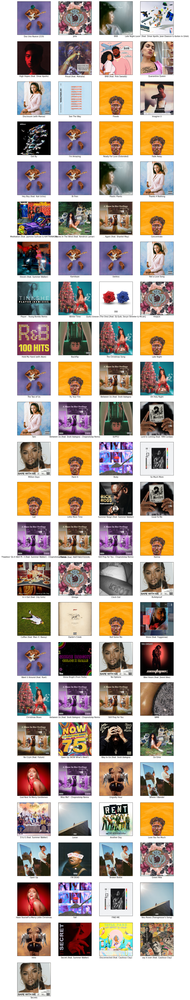

In [53]:
visualize_songs(get_track_info(recs_v3))

In [54]:
get_track_info(recs_v3)

,name,artists,img_url
0,Dos Uno Nueve (219),Omar Apollo,https://i.scdn.co/image/ab67616d00001e02f7f425...
1,Julia,SZA,https://i.scdn.co/image/ab67616d00001e0232f1a3...
2,BRB,Mahalia,https://i.scdn.co/image/ab67616d00001e021f8129...
3,"Late Night Lovin' (feat. Omar Apollo, Jean Daw...","Deaton Chris Anthony, Omar Apollo, Jean Dawson...",https://i.scdn.co/image/ab67616d00001e02ffd047...
4,High Hopes (feat. Omar Apollo),"Joji, Omar Apollo",https://i.scdn.co/image/ab67616d00001e0253f6fa...
...,...,...,...
92,Intro,Chloe x Halle,https://i.scdn.co/image/ab67616d00001e026258cd...
93,Secret (feat. Summer Walker),"21 Savage, Summer Walker",https://i.scdn.co/image/ab67616d00001e021dde84...
94,Disconnected (feat. Cautious Clay),"Tayla Parx, Cautious Clay",https://i.scdn.co/image/ab67616d00001e026d50c6...
95,say it over (feat. Cautious Clay),"Ruel, Cautious Clay",https://i.scdn.co/image/ab67616d00001e024435da...


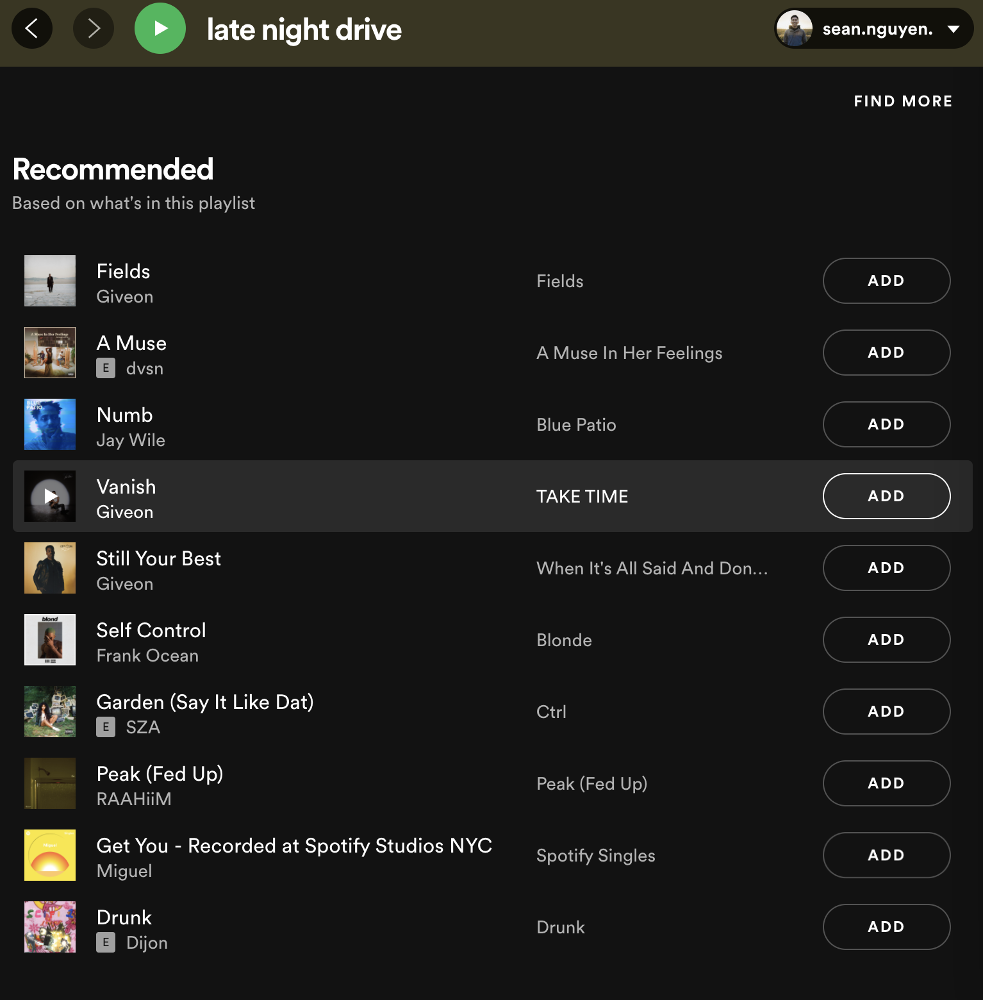

## Comparing our recommendations to Spotify's

When comparing our recommendations to Spotify's recommendations, we can see that we were able to get 'A Muse - dvsn' in our top recommendations. The point isn't to match every single song that Spotify recommends, but rather create something similar. 

For our recommender system, and with prior knowledge, we were able to produce songs from artists that I am already familiar with. There is a lot of room for improvement, but this just means this is a step in the right direction.

## LETS DO IT ON A SONG LEVEL

In [66]:
likeiwantyou = pd.DataFrame(lnd_playlist.iloc[0]).transpose()

In [75]:
likeiwantyou[['acousticness', 'tempo', 'loudness', 'speechiness',
              'liveness', 'energy', 'valence', 'instrumentalness', 'danceability']] = likeiwantyou[['acousticness', 'tempo', 'loudness', 'speechiness',
                                                                                                    'liveness', 'energy', 'valence', 'instrumentalness', 'danceability']].astype(float)

In [78]:
likeiwantyou['year'] = likeiwantyou['year'].astype(int)

In [85]:
recs = make_recommendations(likeiwantyou, catalog_1)

In [86]:
get_track_info(recs)

,name,artists,img_url
0,Still Your Best,Giveon,https://i.scdn.co/image/ab67616d00001e02c1968c...
1,Stuck On You,Giveon,https://i.scdn.co/image/ab67616d00001e02c1968c...
2,This Ain't Love,Giveon,https://i.scdn.co/image/ab67616d00001e0218ff32...
3,Take Time (Interlude),Giveon,https://i.scdn.co/image/ab67616d00001e0218ff32...
4,World We Created,Giveon,https://i.scdn.co/image/ab67616d00001e0218ff32...
5,Like I Want You - Acoustic,Giveon,https://i.scdn.co/image/ab67616d00001e020043fb...
6,Eleven (feat. Summer Walker),"Khalid, Summer Walker",https://i.scdn.co/image/ab67616d00001e022e81eb...
7,I'm Gonna Love You Just A Little More Baby,Summer Walker,https://i.scdn.co/image/ab67616d00001e02b3bf69...
8,4'33'',Lord Of The Lost,https://i.scdn.co/image/ab67616d00001e0203c578...
9,Bad News,Kehlani,https://i.scdn.co/image/ab67616d00001e023ba8dc...


In [95]:
recs2, rec2_artists = make_recommendations_v2(likeiwantyou, artist_catalog, songs, num_artists=20,num_songs=10)

In [96]:
get_track_info(recs2)

,name,artists,img_url
0,Let Em' Know,Bryson Tiller,https://i.scdn.co/image/ab67616d00001e02f62cef...
1,Winter Time,"Sabrina Claudio, Alicia Keys",https://i.scdn.co/image/ab67616d00001e02e81f12...
2,BLACK PARADE - Extended Version,Beyoncé,https://i.scdn.co/image/ab67616d00001e0260e232...
3,Mamba Mentality,Eric Bellinger,https://i.scdn.co/image/ab67616d00001e023af8d5...
4,BLACK PARADE,Beyoncé,https://i.scdn.co/image/ab67616d00001e02637323...
5,So Done (feat. Khalid),"Alicia Keys, Khalid",https://i.scdn.co/image/ab67616d00001e02ba60f6...
6,Fall Slowly (feat. Ashanti) - Extended Version,"Joyner Lucas, Ashanti",https://i.scdn.co/image/ab67616d00001e022927f3...
7,Dream,Eric Bellinger,https://i.scdn.co/image/ab67616d00001e023af8d5...
8,No Co-Sign,Eric Bellinger,https://i.scdn.co/image/ab67616d00001e023af8d5...
9,Keep Doing What You're Doing,Bryson Tiller,https://i.scdn.co/image/ab67616d00001e0225d035...
